# CS146 LBA - The Cost of Basic Goods
# Prof. Scheffler
# Oscar Engelbrektson, Fall 2019

In this assignment, we use data of prices for different foods collected at different grocery stores in Berlin, London, San Francisco and Seoul. The goal is to infer base price for each type of food, a multiplier for each store and location such that price = base price * store multiplier * location multiplier.

My solution to this problem can be divided into two sections: data pre-processing and modelling.
Predict price using food type, store location, and store brand.

Variables: Pricem food type, store location, store brand

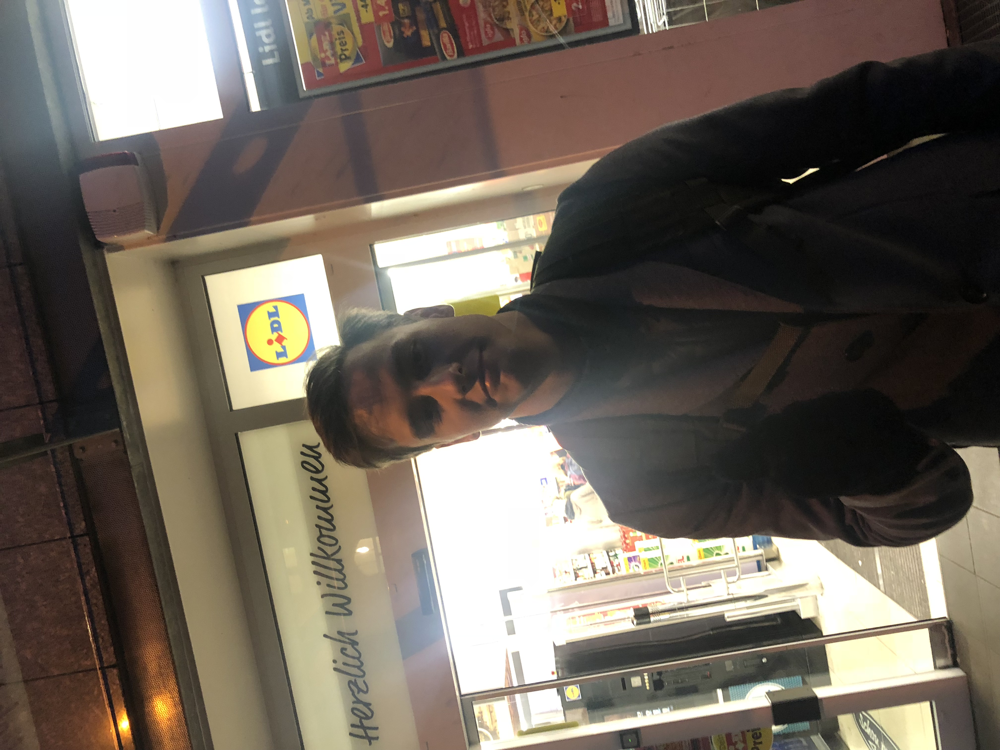

In [62]:
from PIL import Image
#Me, contributing to the Cause.

#Lidl, afternoon Friday, last day to submit data
Image.open('/Users/oscarengelbrektson/Downloads/IMG_4622.jpg')

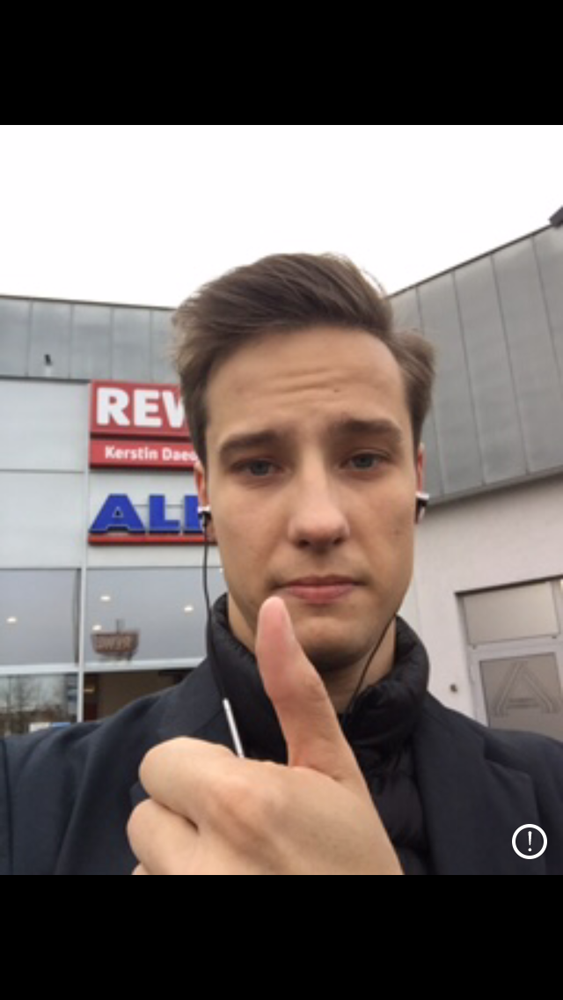

In [63]:
#ALDI, around noon, same Friday
Image.open('/Users/oscarengelbrektson/Downloads/IMG_1729.jpg')

In [2]:
import pystan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as sts

In [3]:
df = pd.read_csv("/Users/oscarengelbrektson/Downloads/CS146 LBA data gathering (Fall 2019) (Responses) - Form Responses 1 (4) copy 3.csv",
                delimiter=";", header=1)


In [4]:
df.head()

,Timestamp,Email Address,Your name,Grocery store,Grocery store street address,Product 1 quantity (kg),Product 1 price (‚Ç¨),Product 2 quantity (kg),Product 2 price (‚Ç¨),Product 3 quantity (kg),...,Product 2 quantity (count),Product 2 price (‚Ç¨).8,Product 3 quantity (count),Product 3 price (‚Ç¨).8,Product 1 quantity (kg).7,Product 1 price (‚Ç¨).9,Product 2 quantity (kg).7,Product 2 price (‚Ç¨).9,Product 3 quantity (kg).7,Product 3 price (‚Ç¨).9
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10/28/2019 13:14:59,brian.swanberg@minerva.kgi.edu,Brian Swanberg,ALDI,Rummelsburger Str. 98,0.88,2.20,1.00,1.88,0.6,...,6.0,1.59,10.0,1.59,0.6,3.99,1.0,5.99,NaN,NaN
2,10/29/2019 14:19:19,emma.stiefel@minerva.kgi.edu,Emma Stiefel,REWE,Karl-Marx-Straße 92-98,1.00,2.49,1.00,1.49,1.0,...,1.0,0.25,6.0,1.59,1.0,13.90,1.0,9.99,1.00,9.98
3,10/29/2019 21:22:30,taha@minerva.kgi.edu,Taha,ALDI,"Hermannstraße 72, 12049 Berlin, Germany",1.00,2.99,1.00,1.79,0.8,...,10.0,1.19,6.0,1.59,0.6,3.99,1.0,5.99,0.35,3.99
4,10/30/2019 16:20:11,michaelchen@minerva.kgi.edu,Michael Hao Chen,Lidl,"Lidl, Leipziger Str. 42",1.00,1.79,0.75,1.99,0.8,...,10.0,1.69,10.0,2.65,0.6,3.99,0.4,2.79,NaN,NaN


In [54]:
df.describe()

,Product 1 quantity (kg),Product 1 price (‚Ç¨),Product 2 quantity (kg),Product 2 price (‚Ç¨),Product 3 quantity (kg),Product 3 price (‚Ç¨),Product 1 quantity (kg).1,Product 1 price (‚Ç¨).1,Product 2 quantity (kg).1,Product 2 price (‚Ç¨).1,...,Product 2 quantity (count),Product 2 price (‚Ç¨).8,Product 3 quantity (count),Product 3 price (‚Ç¨).8,Product 1 quantity (kg).7,Product 1 price (‚Ç¨).9,Product 2 quantity (kg).7,Product 2 price (‚Ç¨).9,Product 3 quantity (kg).7,Product 3 price (‚Ç¨).9
count,90.000000,90.000000,88.000000,88.000000,82.000000,82.000000,90.000000,90.000000,83.000000,83.000000,...,88.000000,88.000000,80.000000,80.000000,89.000000,89.000000,84.000000,84.000000,60.000000,60.000000
mean,1.101711,2.443533,1.045955,2.358205,0.985415,2.271805,0.918800,1.398467,0.920349,1.434940,...,6.931818,1.689830,6.900000,1.736975,0.780427,6.198449,0.812143,6.257014,0.745650,8.282120
std,0.619953,0.935149,0.478615,1.173280,0.405967,0.917897,0.256978,0.662731,0.285378,0.551767,...,3.759419,1.083303,4.217504,1.211651,0.312905,4.488376,0.729971,3.656682,0.313632,5.307599
min,0.100000,0.520000,0.100000,0.330000,0.100000,0.270000,0.120000,0.210000,0.120000,0.270000,...,1.000000,0.120000,1.000000,0.154000,0.100000,1.600000,0.100000,1.290000,0.100000,1.340000
25%,1.000000,1.792500,1.000000,1.770000,1.000000,1.790000,1.000000,1.000000,1.000000,0.990000,...,6.000000,1.177500,6.000000,1.035000,0.500000,3.400000,0.400000,3.567500,0.407500,3.997500
50%,1.000000,2.490000,1.000000,2.290000,1.000000,2.190000,1.000000,1.170000,1.000000,1.450000,...,6.000000,1.590000,6.000000,1.590000,1.000000,5.860000,1.000000,5.580000,1.000000,6.820000
75%,1.000000,2.690000,1.000000,2.505000,1.000000,2.580500,1.000000,1.690000,1.000000,1.790000,...,10.000000,2.315000,10.000000,2.290000,1.000000,6.980000,1.000000,7.485000,1.000000,9.982500
max,5.000000,5.360000,3.200000,9.070000,3.000000,6.760000,1.464000,5.200000,2.000000,3.060000,...,18.000000,4.920000,18.000000,7.160000,1.900000,29.900000,6.750000,17.340000,1.400000,30.000000


### 1. Getting a dataset with 1 row per observation

The desired outcome is a dataset with one row per observation. For each observation there should be a column representing the outcome variable, price, and the predictor variables, food, location, store, respectively.

To convert the above dataset to this desired format the following steps are taken:
1. We normalize each product price by dividing by quantity.*
2. Currently each row contains up to 3 observations for each of the 10 foods. For every food, we iterate over the three observations reported by each student at each location
3. Take note of the store and the location at where the observation was recorded
4. Add it as a row in the new dataset
5. This procedure assumes that each student recorded 3 products/observations for every foods. This is not always the case, if there were not 3 observations students were asked to leave the price empty. Hence, to remove these non-observations, we delete all rows were the price is Nan/missing.


*Details on price normalization: In the data submission questionnaire, the unit of price (currency) was specified for each product. Given that the 3 currencies represented in m20 and m21 rotations–GBP, EUR and USD–are all similar in value, there is no way to know whether an unusual price is based on incorrect currency specification or a specific store/location being priced that way. Consequently, I will proceed on the assumption that data were correctly reported by my classmates, and thus that all prices were reported in EUR.

Note: I acknowledge that it would be possible exploit the store penchent for pricing things at X.99 in the local currency. That is looking at whether someone who was in a non-euro country reported a price that ends with .99. In that case it would seem likely that he/she did not perform any currency conversion. However, it requires making strong assumptions about pricing conventions and what quantities goods are sold in different countries and stores. I mean, it could just be a coincidence. I will be giving my class mates the benefit of the doubt on this one and, at the end of the day, the currency differences are not massive so the end result will probably not be seriously affected.

The unit of quantity was specified for each product. The estimation of base price then, will be expressed on a per unit basis. For example, the estimated base price of bananas will be expressed on a per kilo basis. To achieve this, we begin by normalizing each product price by the product quantity. For example, Brian reported that 0.88kg's of apples sold at a price of €2.2, we calculate 2.2/0.88 to get price/kg. In the case where the reported quantity is 1, this will have no effect.


Starting on the 5th column, all subsequent columns are quantity-price pairs. That is, all odd columns will represent quantities, and the column just after will represent the corresponding price. We use this to iterate over the columns and rows with columns, dividing price/quantity.

We then drop the quantity columns as all prices will be expressed in terms of one unit of quantity, meaning they no longer have any value.

In [6]:
prices, foods, locations, stores = [], [], [], []
col_to_food = {5:"Apples", 11:"Bananas", 17:"Tomatoes", 23:"Potatoes", 29:"Flour, white", 
         35:"Rice, basmati", 41:"Milk, full cream", 47:"Butter", 53:"Eggs", 59:"Chicken breasts"}

#Starting at column 5, there are 6 columns per food
quantity_col_indexes = list(range(5, len(df.columns), 6))
for i in quantity_col_indexes:
    food = col_to_food[i]
    
    for row in range(len(df)):
        location = df.iloc[row, 4]
        store = df.iloc[row, 3]
        
        #3 products for every food
        for j in range(0, 6, 2):
            
            normalized_price = df.iloc[row, i+j+1]/df.iloc[row, i+j]
            
            #Record values
            if not np.isnan(normalized_price):
                prices.append(normalized_price)
                foods.append(food)
                locations.append(location)
                stores.append(store)
            
#Combine lists onto pandas dataframe
dataset = pd.DataFrame()
dataset["price"] = prices
dataset["food"] = foods
dataset["location"] = locations
dataset["store"] = stores

#Step 5, drop non-observations
dataset.dropna()

dataset.head(10)

,price,food,location,store
0,2.5000,Apples,Rummelsburger Str. 98,ALDI
1,1.8800,Apples,Rummelsburger Str. 98,ALDI
2,3.1500,Apples,Rummelsburger Str. 98,ALDI
3,2.4900,Apples,Karl-Marx-Straße 92-98,REWE
4,1.4900,Apples,Karl-Marx-Straße 92-98,REWE
5,2.4900,Apples,Karl-Marx-Straße 92-98,REWE
6,2.9900,Apples,"Hermannstraße 72, 12049 Berlin, Germany",ALDI
7,1.7900,Apples,"Hermannstraße 72, 12049 Berlin, Germany",ALDI
8,2.3625,Apples,"Hermannstraße 72, 12049 Berlin, Germany",ALDI
9,1.7900,Apples,"Lidl, Leipziger Str. 42",Lidl


## 2. Cleaning store
For some stores, people did not format the names identically. For example, there are four different spellings of "Sainsbury's". Consequently, to ensure that every observation that took place at the same store is classified correctly, we need to do some cleaning.

In [7]:
print(dataset.store.unique())

['ALDI' 'REWE' 'Lidl' 'Tesco Express' 'EDEKA' 'Waitrose & Partners'
 'Safeway' 'Waitrose' 'Lotte Mart' 'Tesco' "SAINSBURY'S"
 'Waitrose & Partners ' "Sainsbury's " 'Sainsbury' 'Sainsbury‚Äôs '
 'Waitrose & Partners Islington' 'Tesco ']


In [8]:
for i in range(len(dataset["store"])):
    if dataset["store"][i] in ['Tesco ', 'Tesco Express']:
        dataset.at[i,"store"] = "Tesco"
    
    elif dataset["store"][i] in ["Waitrose & Partners",
                                 "Waitrose & Partners ",
                                 "Waitrose & Partners Islington"]:
        dataset.at[i,"store"] = "Waitrose"
    
    elif dataset["store"][i] in ["Sainsbury’s","SAINSBURY'S","Sainsbury", "Sainsbury's ", 'Sainsbury’s ', 'Sainsbury‚Äôs ']:
        dataset.at[i,"store"] = "Sainsbury's"

In [9]:
#Check we didn't miss anything
print(dataset.store.unique())

['ALDI' 'REWE' 'Lidl' 'Tesco' 'EDEKA' 'Waitrose' 'Safeway' 'Lotte Mart'
 "Sainsbury's"]


## 3. Cleaning the location

My aim is to have location refer to a neighbourhood in Berlin. That is, Berlin is commonly divided into 7 large neighbourhoods– Mitte, Neukölln, Kreuzberg etc– I would like the location to express which of these neighourhoods a store is located. For places outside Germany, I have decided, due to limited sample size, to have one category per city: "London" and "San Francisco".

The format of location is all over the place. SOme have added the name of the store in the location, some have recorded only the street name, others have included the neighbourhood, some have included everything down to the zip. To clean this up, I will employ the python package Geopy.

In [10]:
dataset["location"].unique()[:10]

array(['Rummelsburger Str. 98', 'Karl-Marx-Straße 92-98',
       'Hermannstraße 72, 12049 Berlin, Germany',
       'Lidl, Leipziger Str. 42', 'REWE, Landsberger Allee 68',
       '43-45, Farringdon Rd', 'ALDI, Karl-Marx-Straße 92-98',
       'Lidl, Maybachufer 32-33',
       'Tesco Express, 122-128 Pentonville Rd, Islington, London N1 9TT',
       'Tesco Express, 2 Ecclesbourne Rd, Islington, London N1 3DG'],
      dtype=object)

#### Strategy:

1. Get the dataset in a format that is conduicive to the geocoder API. This includes remove any mention of store and adding the city name to help the API narrow the search (we don't want it to look for Straßburger Str in Straßburg).
2. Run the the goecoder on every UNIQUE adress recorded by a student (this reduces >2000 queries to <100). Create a dictionary mapping from it to the neatly formatted geocoder adress.
3. For each row in the dataset, replace the student recorded location with the geocode location.

Note: there were two people who had added URLs to the location. I removed those manually before uploading the CSV.

In [11]:
import re
import geopy
from geopy.geocoders import Nominatim
geopy.geocoders.options.default_user_agent = "my-application"
nom = Nominatim(timeout=7)

In [12]:
#Place the 4 German stores first
stores = ['ALDI', 'REWE', 'Lidl', 'EDEKA','Tesco Express', 'Waitrose & Partners',
         'Safeway', 'Waitrose', 'Lotte Mart', 'Tesco', "SAINSBURY'S",
         'Waitrose & Partners ', "Sainsbury's ", 'Sainsbury', 'Sainsbury‚Äôs ',
         'Waitrose & Partners Islington', 'Tesco ']

rep = re.compile('|'.join(map(re.escape, stores)))
for i in range(len(dataset["location"])):
    #If german store and Berlin not in adress, add Berlin at the end
    if dataset["store"][i] in stores[:4] and 'Berlin' not in dataset["location"][i]:
        dataset["location"][i] = dataset["location"][i] + " Berlin"
        
    #If present, remove store name
    dataset["location"][i] = rep.sub('', dataset["location"][i])
    
    #For some reason, the German double "s" gets converted to "√ü" and "ö" to "√∂" which throws errors
    if "√∂" in dataset["location"][i]:
        dataset["location"][i] = dataset["location"][i].replace("√∂", "ö")
    if "√ü" in dataset["location"][i]:
        dataset["location"][i] = dataset["location"][i].replace("√ü", "ß")
        
    #The API doesn't recognize "Barbican" in London, so remove it from the location tag
    if "Barbican" in dataset["location"][i]:
        dataset["location"][i] = dataset["location"][i].replace("Barbican", "")
    
    

#Get the full location information and add the relevant pieces to the appropriate dicts
unique_addresses = dataset.location.unique()
address_dict = {}
postcode_dict = {}

for i in range(len(unique_addresses)):
    full_location = nom.geocode(unique_addresses[i], addressdetails=True)
    postcode_dict[unique_addresses[i]] = full_location.raw['address']['postcode']
    
    #Location data varies by region
    if full_location.raw['address']['country'] == 'Deutschland':
        try:
            address_dict[unique_addresses[i]] = full_location.raw['address']['city_district']
        except KeyError:
            address_dict[unique_addresses[i]] = full_location.raw['address']['town']
            
    elif full_location.raw['address']['country'] == 'United Kingdom':
        address_dict[unique_addresses[i]] = full_location.raw['address']['state_district']
        
    else:
        address_dict[unique_addresses[i]] = full_location.raw['address']['city']

/Users/oscarengelbrektson/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/Users/oscarengelbrektson/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/oscarengelbrektson/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

In [13]:
dataset["postal codes"] = [postcode_dict[dataset["location"][i]] for i in range(len(dataset["location"]))]
dataset["district"] = [address_dict[dataset["location"][i]] for i in range(len(dataset["location"]))]
dataset.head()

,price,food,location,store,postal codes,district
0,2.50,Apples,Rummelsburger Str. 98 Berlin,ALDI,10319,Lichtenberg
1,1.88,Apples,Rummelsburger Str. 98 Berlin,ALDI,10319,Lichtenberg
2,3.15,Apples,Rummelsburger Str. 98 Berlin,ALDI,10319,Lichtenberg
3,2.49,Apples,Karl-Marx-Straße 92-98 Berlin,REWE,12043,Neukölln
4,1.49,Apples,Karl-Marx-Straße 92-98 Berlin,REWE,12043,Neukölln


#### 4. Dealing with outliers : Reviewing the distribution of prices, filtered on food type

Text(0.5, 1.0, 'Chicken breasts')

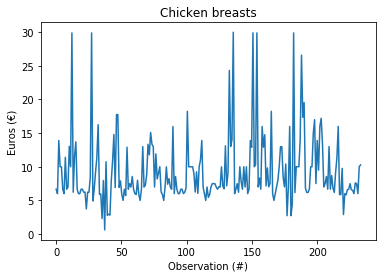

In [14]:
data = dataset[dataset["food"]=="Chicken breasts"].price
x = np.linspace(0, len(data), len(data))
plt.plot(x, data)
plt.ylabel("Euros (€)")
plt.xlabel("Observation (#)")
plt.title("Chicken breasts")

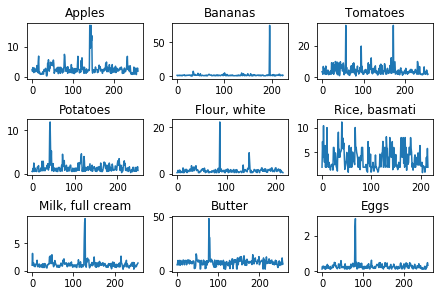

In [15]:
#Doing the same for the remaining 10 plots

#Code adapted from https://stackoverflow.com/questions/31726643/how-do-i-get-multiple-subplots-in-matplotlib

foods = ["Apples", "Bananas", "Tomatoes", "Potatoes", "Flour, white", 
         "Rice, basmati", "Milk, full cream", "Butter", "Eggs", "Chicken breasts"]

fig, ax = plt.subplots(nrows=3, ncols=3, constrained_layout=True)
i = 0
for col in ax.flat:
        data = dataset[dataset["food"]==foods[i]].price
        x = np.linspace(0, len(data), len(data))
        col.plot(x, data)
        col.set_title(foods[i])
        i+=1

plt.show()

We see that there are a number of drastic outliers, several standard deviations away from the rest of the data. There is atleast one such outlier for every food except Rice. This puts me in a tricky spot. 1 kilo of bananas for 75€ is probably a typo, but then again I have no way of verifying this suspicion. My alternatives, as I see them are the following: keep the all the data; drop the outliers; ask the people who submitted the outliers whether it was indeed a type.

1. If they are typos, running the model without pruning these outliers would bias our results, particularly by inflating the variance of the posteriors.
2. Dropping these outliers would give tighter posteriors. It would also give a better picture of the typical prices, as the mean is skewed by the presence of outliers. However, if these are in fact not typos, dropping them could seriously bias results.
3. I have contact information for every person who submitted outliers, I could just write an email script that takes that gives the necessary context/presents the data and then asks whether the data was correctly reported. This could give clarify whether these are legit observation or mistakes. Critically, time is running a little late for people to have reasonable time to respond. IMOP this would have been the way to go had I came across this earlier in the week. Further, perhaps, we have been reading a lot about human subject research and I suspect this would not be in good keeping with the rules (which seem to be seriously restrictive? anonymize everything)?

In the end, because it is more convenient and, for all I know, the data is correct have decided to procede with all the data.

#### 5. Modifying the dataframe to run on the stan model

1. Stan only takes reals and integers as inputs, greater than 0. Consequently, I will create a numerical encoding for each value of each categorical variable. I will base the numerical encoding on the alphabetical order of the values in each category, such that "Aldi" is 1 and "Apples" is 1.

In [16]:
store_num, store_labels = pd.factorize(pd.Categorical(dataset["store"]), sort=True)
store_num += 1
dataset["store_num"] = store_num

district_num, district_labels = pd.factorize(pd.Categorical(dataset["district"]), sort=True)
district_num += 1
dataset["district_num"] = district_num


food_num, food_labels = pd.factorize(pd.Categorical(dataset["food"]), sort=True)
food_num += 1
dataset["food_num"] = food_num

dataset.head()

,price,food,location,store,postal codes,district,store_num,district_num,food_num
0,2.50,Apples,Rummelsburger Str. 98 Berlin,ALDI,10319,Lichtenberg,1,4,1
1,1.88,Apples,Rummelsburger Str. 98 Berlin,ALDI,10319,Lichtenberg,1,4,1
2,3.15,Apples,Rummelsburger Str. 98 Berlin,ALDI,10319,Lichtenberg,1,4,1
3,2.49,Apples,Karl-Marx-Straße 92-98 Berlin,REWE,12043,Neukölln,5,7,1
4,1.49,Apples,Karl-Marx-Straße 92-98 Berlin,REWE,12043,Neukölln,5,7,1


The dataset is now looking the way we want it. This concludes the pre-processing.

#### Suggestions for future improvement of LBA assignment:
Much of this cleaning hassle was caused by inconsistent data reporting standards among students. As it is in the direct self-interest of each student to report data in the correct format–they must themselves clean up any inconsistencies before they can start modelling–the prospects for achieving this end are promising. All that is required is some more guidance. In this light, for next time, I would recommend tweaking the data submission survey in the following ways:
1. Add an example submission for each of the location and store questions, e.g. "Rummelsburger Str. 98 Berlin". This would serve to standardize the format.
2. Write a paragraph describing the appropriate reporting standards for price and quantity of products. It should specify clear guidelines for the currency in which a price should be reported. This would make clear whether a student should report prices in the local currency or themselves perform the local currency-to-euro conversion.
3. Add a review before submission page.

I get that data pre-processing is an important skill and as such practice is to be desired in assignments. However, clarity around how data were reported  would not detract from this. In fact, it may add to it. In my experience, when faced with two approximately equally plausible interpretations, the most convenient interpretation tends to guide decisions. For example, I opted not to perform currency conversion. Yet, had the reporting practices been clear, there would have been no room for such interpretation.

Furthermore, if a store has a broad range of offerings for every food, i.e. both cheap and expensive versions, taking the average for the store brand could paint a misleading picture. For example, if a store offers a more exclusive line of products alongside cheaper brands offered at all stores, that would drag the base price multiplier up indicating that it is more expensive store. This could indicate that the store is not a good place to go if one cares about getting cheap food. In reality, however, it is just as cheap as other stores - but it also offers the alternative to buy more exclusive products should one want! 
A solution to this would be to make an explicit rule for choosing which prices to report if there are more than 3 to choose from. For example, reporting the 3 cheapest alternatives would be a consistent rule that side-steps the "broad offerings"-issue (although it would slightly alter the research question to one about the prices of the cheapest products available).

## Modelling the price of each food as (base price) * (location multiplier) * (store multiplier)
*Note: the Stan model draws on Chapter 1.13 of the Stan User's Guide, V.2.18*

Source: https://mc-stan.org/docs/2_18/stan-users-guide/multivariate-hierarchical-priors-section.html

The objective of this excercise is to model the price of a food as the product of its type, the location and the store in which it was bought. Food type, location and store are each categorical variables. The aim of this stan model, is to infer posterior distributions over the base price of each category of food (here denoted as food), multipliers associated with each location and each store, respectively. That is, we seek a posterior over each category.

#### Likelihood
price[x] ~ Normal(food[x] * location[x] * store[x] | sigma)

The price of good X is distributed according to a normal distribution with mean equal to the product of the base price of the food categoru of x, the multiplier of the location category of x and the the multiplier of the store category of x. And sigma inferred from data. I choose a normal distribution because it is convenient to express the mean as a product of the desired quantities and I expect error of the model to be normally distributed around the mean. The normal distribution is truncated at x<0 as negative prices do not exist in stores.

#### Prior over district and store multipliers:
store_multipliers[x] ~ lognormal(-0.125, 0.5)

district_multipliers[x] ~ lognormal(-0.125, 0.5)

Each district and store has the same prior, this choice was made out of ignorance (I don't know anything about several of these stores) and convenience (there are a lot of them). I believe store prices are normally distributed around mean store price (admittedly unknown). However, as we are looking to express the effect of a store as a factor to be multiplied with the base price, my above belief about the distribution of absolute prices around the mean translates into a log-normal distribution around the mean (parameters are choosen such that the average multiplier is 1). The same reasonning aplies to neighbourhoods. The support of the lognormal distribution is appropriate for a price multiplier, since it only gives non-negative numbers and prices cannot be negative.

I choose, mu=-0.125 and sigma = 0.5 because  E(x) ~ lognormal(-0.125, 0.5) = 1. (I played around with sigmas until I found a reasonable looking variance and then solved for the mu that would give E(x)=1). Thus, my prior is conservative in the sense that the average mutliplier is 1. Consequently, this has the benfit of yielding unbiased estimate of the mean base price for each food (I think). Here's my reasoning:

1. We are estimating the model E(price) = E(food * district* location).

2. Distributing the expectations we have E(price) = E(food) * E(district) * E(location)

3. As the average multiplier is 1, we have: E(price) = E(food) * 1 * 1

By the same logic, if the E(district)≠1 we would inflate or deflate the base price. For example, if E(district) = 0.5, we would have E(price) = 0.5E(food). Which implies that we estimate base prices twice as large as they should be.

I chose sigma =  0.5 because then 95% of multipliers will be within 1 */ (0.5)^2. This puts the 2.5% percentile at 0.25 and the 97.5% percentile at 4, which seems appropriately conservative.

#### Prior over base price
base_prices[x] ~ cauchy(2.5, 10)

I choose a cauchy distribution truncated at the lowerbound 0. I truncated it because prices in stores are non-negative. I choose a cauchy distribution with because it is symmetrical around the mean (this mirrors my prior beliefs) and has heavy tails making it an appropriately broad prior. I choose 2.5 as value for the location parameter as it is my best guess at the average price of 1 kilo of generic good.

Admittedly, without looking at the data, I have a sense that 1 kilo of chicken breasts is more expensive than the same quanity of rice. For convenience, I decided not to have a unique prior parameterization for each food, reasoning that the prior, so long as it is broad, should not have a large impact on the posterior distrbution given the rather large number of datapoints for each food.

#### Prior over sigma
sigma ~ inv_gamma(1, 1)

Sigma is the scale parameter for the normal distribution. Consequently, the support–positive reals– of the inverse gamma is appropriate. Furthermore, the distribution is strongly skewed towards zero with a rather heavy tail, something which nicely captures my prior beliefs. 

In [17]:
stan_code = """
data {  
    int<lower=0> N; //number of observations
    int<lower=0> F; //number of foods
    int<lower=0> S; //number of stores
    int<lower=0> L; //number of locations
    
    int<lower=1> food[N]; //food type of observation
    int<lower=1> store[N]; //store of observation
    int<lower=1> district[N]; //location of observation
    
    real<lower=0> prices[N];
}

parameters {
    real<lower=0> base_prices[F]; //number of stores    
    real<lower=0> store_multipliers[S]; //number of stores    
    real<lower=0> district_multipliers[L]; //number of stores
    
    real<lower=0> sigma; 
}
model {

    base_prices ~ cauchy(2.5, 10);
    store_multipliers ~ lognormal(-0.125, 0.5);
    district_multipliers ~ lognormal(-0.125, 0.5);
    sigma ~ inv_gamma(1, 1);

    
    for (n in 1:N) {
        prices[n] ~ normal(base_prices[food[n]] * 
                            district_multipliers[district[n]] * 
                            store_multipliers[store[n]], sigma);
    }
}
"""

In [18]:
#Compile the model
stan_model = pystan.StanModel(model_code=stan_code)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_b518360a018baf40be353cc8d505b652 NOW.


In [19]:
data = {  
    "N": len(dataset), #number of observations
    "F": len(dataset.food_num.unique()), #number of foods
    "S": len(dataset.store_num.unique()), #number of stores
    "L": len(dataset.district_num.unique()), #number of districts
    
    "food": dataset.food_num, #food type of observation
    "store": dataset.store_num, #store of observation
    "district": dataset.district_num, #districts of observation
    
    "prices":dataset.price,
}

In [20]:
#Sample posterior distribution over lambda
stan_results = stan_model.sampling(data = data)

In [55]:
print(stan_results.stansummary(pars=['base_prices', "store_multipliers", "district_multipliers",'sigma'], probs=[0.025, 0.5, 0.975]))

Inference for Stan model: anon_model_b518360a018baf40be353cc8d505b652.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                           mean se_mean     sd   2.5%    50%  97.5%  n_eff   Rhat
base_prices[1]             5.18    0.03   1.06   3.37    5.1   7.47   1301    1.0
base_prices[2]             3.78    0.02   0.81    2.4   3.72   5.55   1454    1.0
base_prices[3]            15.21    0.09   2.99  10.05  15.03  21.71   1228    1.0
base_prices[4]            17.12     0.1   3.36  11.34  16.92  24.37   1245    1.0
base_prices[5]             0.54  6.8e-3   0.31   0.06    0.5   1.25   2134    1.0
base_prices[6]             2.32    0.01   0.56   1.36   2.26   3.57   1670    1.0
base_prices[7]             2.09    0.01   0.52   1.24   2.06   3.23   1495    1.0
base_prices[8]             2.68    0.02   0.62   1.63   2.64   4.02   1517    1.0
base_prices[9]             6.51    0.04   1.31   4.25   6.41   9.38   128

In [21]:
#All rhats are 1, so everything converged nicely.
#Seems like most location multipliers are below 1 though?
samples = stan_results.extract()

# Results
*Code for plotting posterior samples adapted from session 7.2*

#### Base price for each food

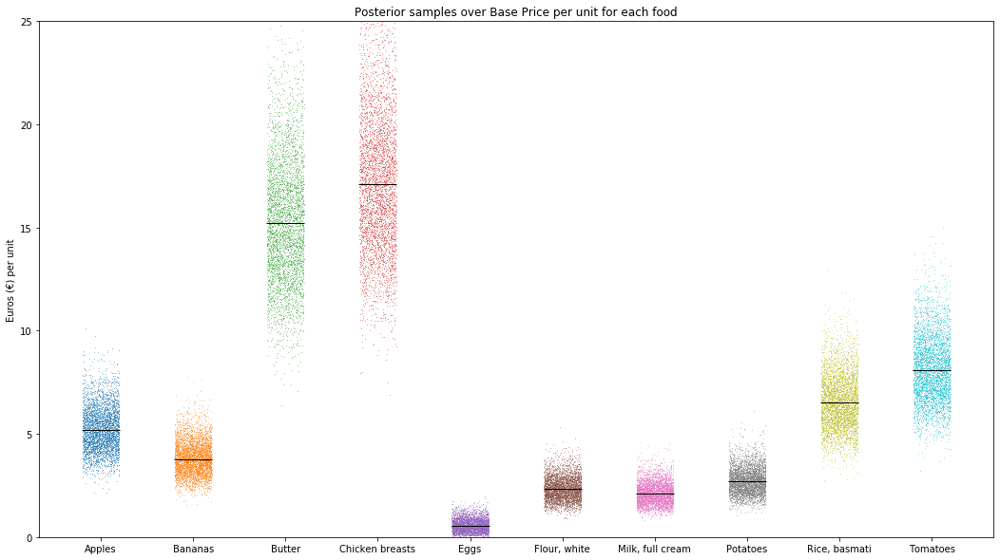

In [26]:
#Code adapted from session 7.2

plt.figure(figsize=(18,10))
for i in range(len(dataset.food.unique())):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
             samples['base_prices'][:,i], ',', alpha=0.5)
    
    
plt.plot(range(1, len(dataset.food.unique())+1),
         samples['base_prices'].mean(axis=0), 
         marker='_',linewidth=0,color="black",alpha=1,markersize=40)

plt.xticks(range(1, len(dataset.food.unique())+1), 
           sorted(list(dataset.food.unique())))
plt.ylabel("Euros (€) per unit")
plt.title("Posterior samples over Base Price per unit for each food")
plt.ylim(0, 25)
plt.show()

Plot showing distribution of samples from the posterior over base price for each of the foods. The black horizontal bar indicates the mean of the posterior samples. Looking at the mean, broadly speaking, there are no surprises here: the magnitude of prices seem right and their relative ranking does too. Maybe rice is more expensive than I would have imagined.

The variance of butter and chicken breasts may seems very wide, but it is important to remember that it also depends on the scale. Although the absolute variance is much larger, the relative variance is not, when adjusting for the value of the mean.

#### Multipliers for each store 

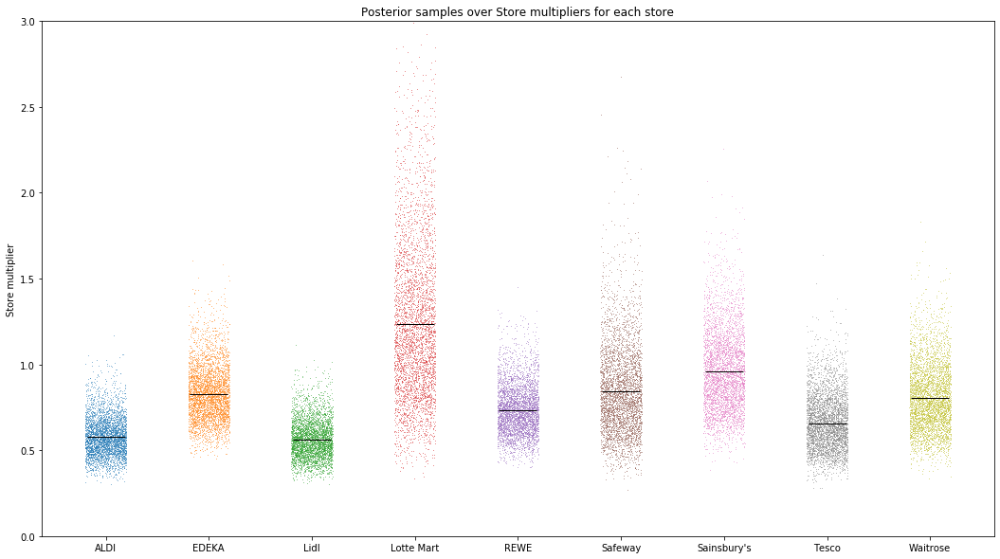

In [23]:
plt.figure(figsize=(18,10))
for i in range(len(dataset.store.unique())):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
             samples['store_multipliers'][:,i], ',', alpha=0.5)
    
    
plt.plot(range(1, len(dataset.store.unique())+1),
         samples['store_multipliers'].mean(axis=0), 
         marker='_',linewidth=0,color="black",alpha=1,markersize=40)

plt.xticks(range(1, len(dataset.store.unique())+1), 
           sorted(list(dataset.store.unique())))
plt.ylabel("Store multiplier")
plt.title("Posterior samples over Store multipliers for each store")
plt.ylim(0, 3)
plt.show()

Plot showing distribution of samples from the posterior over multipliers for each of the stores. The black horizontal bar indicates the mean of the posterior samples.

Having lived in all three cities, this agrees with my experience. Seoul is more expensive than the US, which is about the same as the UK, which are all more expensive than Germany.
Within Germany, ALDI and Lidl are the cheapest and Edeka is the most expensive.
Within the UK, Tesco is the cheapest and Sainsbury's is the most expensive.
Lotte Mart is painfully expensive (with very large variance it seems).

### Multipliers for each district

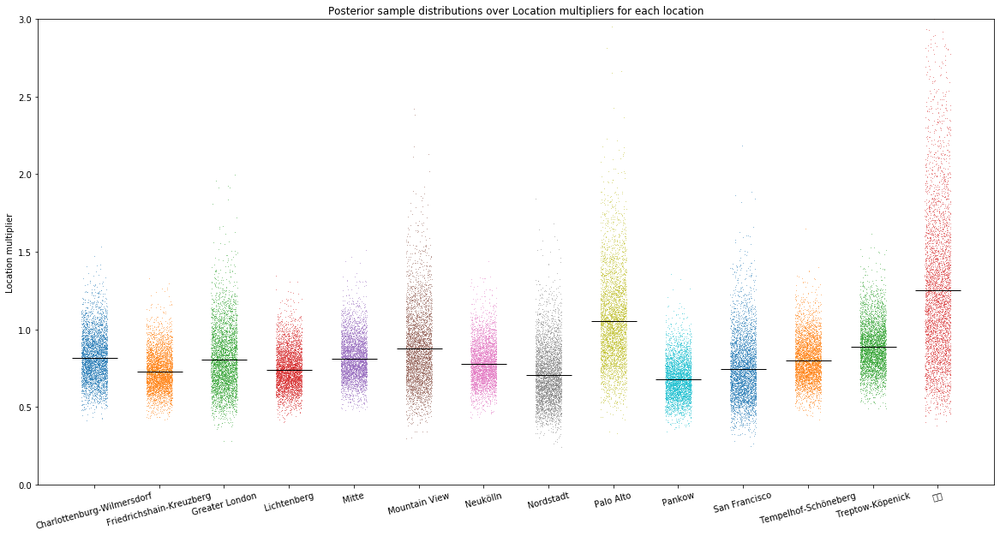

In [34]:
plt.figure(figsize=(20,10))
for i in range(len(dataset.district.unique())):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
             samples['district_multipliers'][:,i], ',', alpha=0.5)
    
    
plt.plot(range(1, len(dataset.district.unique())+1),
         samples['district_multipliers'].mean(axis=0), 
         marker='_',linewidth=0,color="black",alpha=1,markersize=53)

plt.xticks(range(1, len(dataset.district.unique())+1), 
           sorted(list(dataset.district.unique())),rotation=15)
plt.ylabel("Location multiplier")
plt.title("Posterior sample distributions over Location multipliers for each location")
plt.ylim(0, 3)
plt.show()

The far-right posterior is for Seoul

### Location multipliers within Berlin

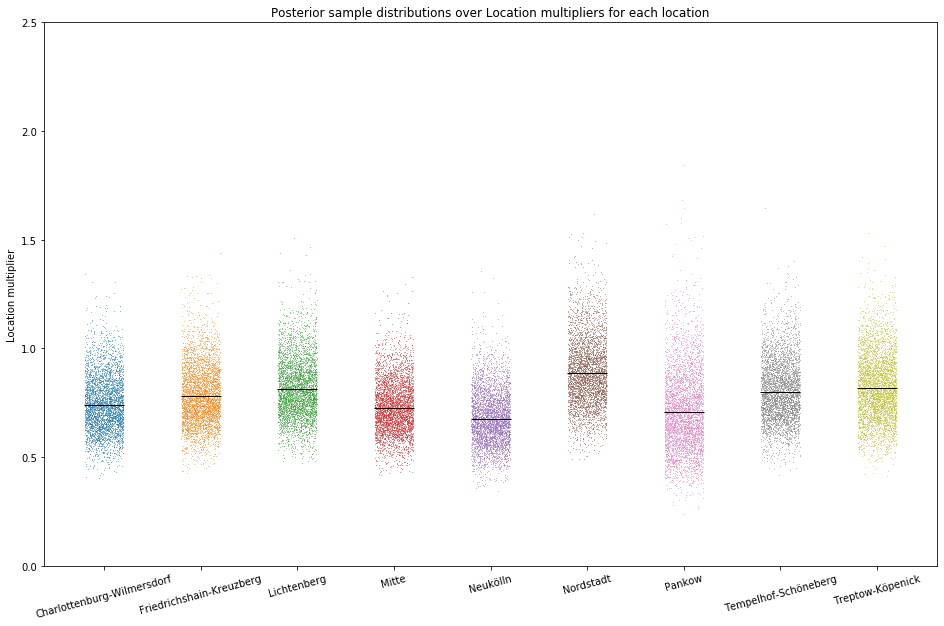

In [47]:
# LOCATION FOR BERLIN

berlin_indices = [4,7,5,2,10,13,8,12,1]
berlin_districts = ['Lichtenberg','Neukölln','Mitte',
                  'Friedrichshain-Kreuzberg','Pankow',
                  'Treptow-Köpenick','Nordstadt',
                  'Tempelhof-Schöneberg','Charlottenburg-Wilmersdorf']

plt.figure(figsize=(16,10))
for i in range(len(berlin_indices)):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
             samples['district_multipliers'][:,berlin_indices[i]-1], ',', alpha=0.5)
    
plt.plot(range(1, len(berlin_indices)+1),
         [samples['district_multipliers'][:,Berlin_code[i]-1].mean(axis=0) for i in range(len(berlin_districts))], 
         marker='_',linewidth=0,color="black",alpha=1,markersize=40)

plt.xticks(range(1, len(berlin_indices)+1), 
           sorted(list(berlin_districts)),
          rotation=15)
plt.ylabel("Location multiplier")
plt.title("Posterior sample distributions over Location multipliers for each location")
plt.ylim(0, 2.5)
plt.show()

### Location multipliers outside Germany

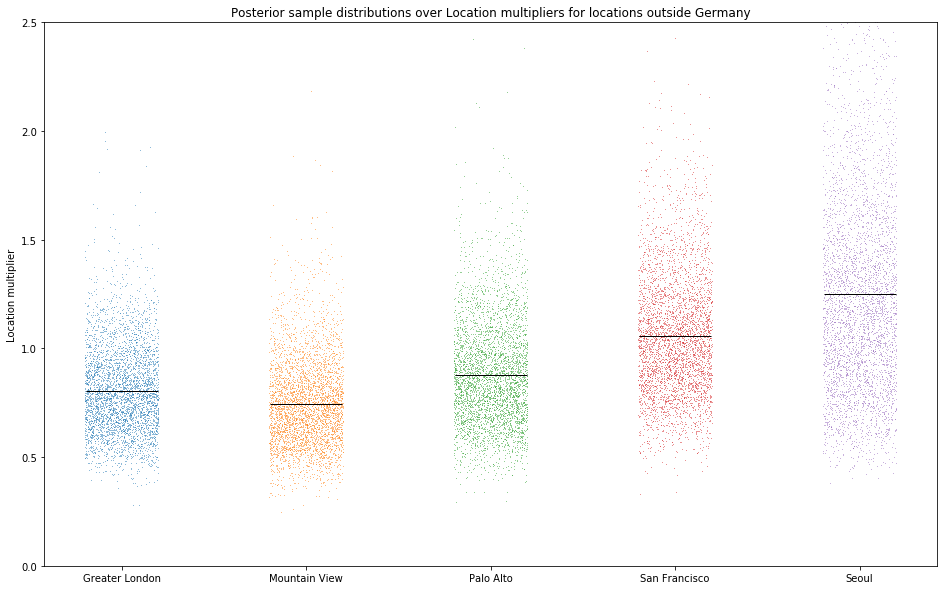

In [53]:
not_berlin_indices = [3,11,6,9,14] 
not_berlin_districts = ['Greater London','San Francisco',
                'Mountain View','Palo Alto','Seoul']


plt.figure(figsize=(16,10))
for i in range(len(not_berlin_indices)):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
             samples['district_multipliers'][:,not_berlin_indices[i]-1], ',', alpha=0.5)
    
plt.plot(range(1, len(not_berlin_indices)+1),
         [samples['district_multipliers'][:,not_berlin_indices[i]-1].mean(axis=0) for i in range(len(not_berlin_districts))], 
         marker='_',linewidth=0,color="black",alpha=1,markersize=72)

plt.xticks(range(1, len(not_berlin_indices)+1), 
           sorted(list(not_berlin_districts)))
plt.ylabel("Location multiplier")
plt.title("Posterior sample distributions over Location multipliers for locations outside Germany")
plt.ylim(0, 2.5)
plt.show()

Seoul comes out as the most expensive place to buy food, having lived in all three cities, this agrees with my experience. However, only one store was sampled from Seould, however, so not too much should be read into this.

## Investigating the correlation location multipliers in our model and local rental prices

Does price variation by geographical location correlate with variation in rental prices in
Berlin, or not?

As I already have location multipliers from my model, all additional data I need to perform this comparison is data on rental prices in berlin, segregated by geographical region. I found a really detailed dataset with rental prices for each postcode. I will use this dataset to anwer the question by mapping postal codes to districts, such that I have both rental prices and multipliers for each. Given this dataset, computing a correlation coefficient will be trivial.

The trick, then, lies in associating each postcode in the rent prices dataset with a district of Berlin. To this end, I once again turn to Geopy.

Rental Data source: https://www.berlinhyp.de/bhyp/en/medias/sys_master/pdf/h68/hd1/8812673892382.pdf?fbclid=IwAR1MZoAAsTi6tZoqEySS789g45_mi9nl1RgwgSCjEvJAFKn8KN-xEAplHFM

In [142]:
rent_df = pd.read_csv("/Users/oscarengelbrektson/Downloads/berlin_rent_prices.csv")
rent_df.head()

,Postcode,Rental_offers,Basic_rent
0,10585,220,13.11
1,10587,173,11.74
2,10589,200,11.61
3,10623,82,12.74
4,10625,149,12.24


Basic rent is measured in Euros per square-meter per month.

In [175]:
def postcode_to_district(postcode):
    """
    Search for address associated postcode in Berlin, 
    which returns postcode, Berlin, Deutschland, (latitude, longitude)
    take coordinates and run reverse search to get district
    """
    coordinate = nom.geocode("%s Berlin" %postcode).latitude, nom.geocode("%s Berlin" %postcode).longitude  
    try:
        return nom.reverse(coordinate, addressdetails=True).raw["address"]["city_district"]
    except KeyError:
        return nom.reverse(coordinate, addressdetails=True).raw["address"]['town']
    
    
#Make new column with district associated with 
rent_df["district"] = rent_df["Postcode"].apply(postcode_to_district)

In [201]:
#Get the relevant districts by taking the intersection of the two district sets
districts = set(dataset.district.unique()) & set(rent_df.district.unique())

#Get mean rental price for each district
district_rent = [rent_df[rent_df["district"]==district].Basic_rent.mean() for district in districts]


#Get mean district multiplier for each district
district_multi = samples['district_multipliers'].mean(axis=0)

#Get indexes of Berlin districts, 
#This works because both district lists are alphabetically sorted
indices = np.nonzero(np.in1d(dataset.district.unique(), rent_df.district.unique()))

#Use indices to extract only Berlin district multipliers
district_multi = district_multi[indices]

In [205]:
#Correlation between the two
np.corrcoef(district_rent, district_multi)[0,1]

0.552577762645837

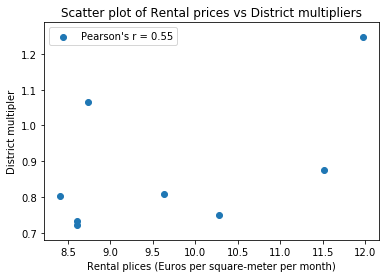

In [215]:
plt.scatter(district_rent, district_multi, label="Pearson's r = 0.55")
plt.title("Scatter plot of Rental prices vs District multipliers")
plt.xlabel("Rental plices (Euros per square-meter per month)")
plt.ylabel("District multipler")
plt.legend(loc=0)
plt.show()

In this dataset, then, we see a relatively strong correlation of 0.55 between rental prices and model multipliers in Berlin districts. This is in good agreement with my personal expecations: there are expensive areas in cities and in them most things are more expensive, rents as well as food stores.

If we had incorporated other countries in this analysis, the correlation would likely have gone up. But my suspicion is that this would be caused by between country price-level differences rather than within country variation in rental prices and food prices. This is because the between country differences are likely to be much larger in scale than intercity variations, and would thus come to dominate correlation equation. This would be excacerbated because of the low number of districts visited outside of berlin, 1 in Seoul, 1 in london (literally making within city variation impossible) and 3 in the US. This, in my opinion, would consequently not yield insight into the question that was supposed to be investigate.

# Modifying the Stan model to have correlated location multipliers

Instead of having an independently sampled multiplier for each geographical region in the model, use a
correlated prior where the correlation coefficient is determined by the distance between geographical
locations.
The motivation for this is that we would expect two stores or two neighborhoods that are close together
to have similar price multipliers, whereas we expect there to be little correlation between price
multipliers in locations that are far apart. 

Here is my approach
1. Get latitude and longitude for each store (add two columns to dataset)
2. Define Kernel function, modify RBF kernel to take actual distance between two coordniates. This will return a measure of similarity between 0 and 1 for each coordinate pair, where 1 represents no distance. https://en.wikipedia.org/wiki/Radial_basis_function_kernel
3. Generate covariance matrix using kernel function
4. Run stan model using this. Multivatiate normal???

In [236]:
def district_to_coordinates(district):
    """
    Search for coordinates associated district,
    if not found report error
    """
    try:
        return nom.geocode("%s" %district).latitude, nom.geocode("%s" %district).longitude
    except KeyError:
        return print("\nError: %s coordinates not found" %district)
    

#coordinates_list = [district_to_coordinates(district) for district in dataset.district.unique()]
#Ran out of Geopy queries mid-run, extracted the following list for each unique district
coordinates_list = [(52.5321606, 13.5118927),
                    (52.4811497, 13.4353501),
                    (52.5176896, 13.4023757),
                    (52.5153063, 13.4616117),
                    (51.4893335, -0.144055084527687),
                    (37.7792808, -122.4192363),
                    (37.3893889, -122.0832101),
                    (37.4443293, -122.1598465),
                    (52.59766255, 13.436351401882),
                    (37.5666791, 126.9782914),
                    (52.417893, 13.6001848),
                    (50.7388636, 7.0841169),
                    (52.4406033, 13.3737035),
                    (52.5078558, 13.2639518)]

In [ ]:
district_to_coordinates_dict = {}
for i in range(len(dataset.district.unique())):
        district_to_coordinates_dict[dataset.district.unique()[i]] = coordinates_list[i]

#Make new column with coordinates associated with each district
dataset["district_coordinates"] = dataset["district"].map(district_to_coordinates_dict)

In [282]:
import geopy.distance
def kernel(coordinate1, coordinate2, sigma):
    '''
    Takes two coordinates and returns a measure of similarity
    based on a modified RBF kernel, where ||x-x´|| is geodesic distance
    '''
    distance = geopy.distance.distance(coordinate1, coordinate2).km
    similarity = np.exp((-1/2*sigma)*distance**2)
    return similarity


#Initializing an empty SxS covariance matrix,
#Filling in each index i, j with kernel(coordinate_i, coordinate_j)
S = len(dataset.district.unique())
covariance_matrix = np.zeros(shape=(S,S))
for i in range(S):
    coordinate_i = district_to_coordinates_dict[dataset.district.unique()[i]]
    
    for j in range(S):
        coordinate_j = district_to_coordinates_dict[dataset.district.unique()[j]]
        
        #Sigma is set to 0.1 via experimentation, the highest correlation is usually around .5
        covariance_matrix[i][j] = kernel(coordinate_i, coordinate_j, 0.1)

My plan for the had been to, instead of making a new, independent log-normal distribution for each location multiplier, to make one multivariate log-normal distribution (assuming such a thing exists, ik multivariate normal is a thing) with the same number of dimensions as there are districts (1 for each) with the same mean parameter for each the same as before but now with the covariance matrix as the variance parameter.
But once it came to implementing this in Stan, it quickly became clear: my Stan skills just aren't there yet. Even if I get the prior to work, I would need to modify the likelihood function to get the relevant dimension of the multivariate log-normal for each product, and even if I got that to work, it doesnt make much sense to stick a distribution into the product that forms the mean of a normal distribution... In the words of the late Barbara Corcoran, "And for that reason, I'm out".

Thanks for a cool assignment.

# HCs
#### Correlation. 
I compute and analyze the correlation between rental prices and model multipliers in different districts. I also explain the effect cross-country measurements would have on the correlation coefficient, demonstrating understanding of correlation. Lastly, I think the computation of the covariance matrix for the stretch problem also made some creative use of correlation.

#### Modelling.
I devise a model to solve the inference problem. I clearly justify the choices of priors and likelihood. I implement it, then visualize and explain the results. Furthermore, throughout the pre-processing stage, I repeatedly make decisions about how to treat the data with reference to how it will impact the model, examples include the outliers, the currency conversion issue.

#### Distributions.
When developing the model, I justify the choice of priors and likelihood based on the properties of distributions. I.e. "this is what I know about the variable" and then mapping that to a distribution with the desired properties.

#### Dataviz
Throughout, I use visualisation to summarize results and data. Examples are the plot showing the outliers, which serves to inform a discussion about outliers and how to treat them, model results by plotting posteriors. Each plot follows presentational conventions: appropriately labelled, axes title etc. This makes the data easy to take in.